In [1]:
import pandas as pd
import sys

sys.path.append('../../')
from src.transform import load_json,transform_diff_avg,transform_diff_experiments
from src.plot_helpers import plot_experiment_range,plot_correlation_matrix,plot_boxplot

indoors_cols = load_json("../../json/locations.json")["wings_indoors"]

In [2]:
df = pd.read_csv('../../data/clean_data/all_sensors.csv',index_col=0,parse_dates=True)
df_air_indoor = pd.read_csv('../../data/clean_data/airwings.csv',index_col=0,parse_dates=True)

df_air_indoor = df_air_indoor.loc[(df_air_indoor['sensor'] == 'air_wings_indoor') | (df_air_indoor['sensor'] == 'air_wings_indoor_ref'), indoors_cols]

df_air_indoor.rename(columns={'device_id': 'sensor'}, inplace=True)
df_air_indoor['sensor'] = 'AWI_indoor_' + df_air_indoor['sensor'].astype(str)

df_air_indoor

/tmp/ipykernel_2039860/3833256816.py:1: DtypeWarning: Columns (6,26) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('../../data/clean_data/all_sensors.csv',index_col=0,parse_dates=True)


,co2,tvoc,co,pm_1.0,pm_2.5,pm_10,temperature,humidity,pressure,sensor
datetime,,,,,,,,,,
2024-10-16 05:00:43,657.32,0.0,0.5,2.15,2.27,2.24,26.60,33.0,1010.26,AWI_indoor_2.0
2024-10-16 05:01:43,657.32,0.0,0.5,2.15,2.25,2.23,26.60,33.0,1010.28,AWI_indoor_2.0
2024-10-16 05:02:43,657.31,0.0,0.5,2.13,2.24,2.22,26.60,33.0,1010.30,AWI_indoor_2.0
2024-10-16 05:03:43,657.31,0.0,0.5,2.05,2.15,2.13,26.59,33.0,1010.30,AWI_indoor_2.0
2024-10-16 05:04:43,657.31,0.0,0.5,2.00,2.11,2.09,26.59,33.0,1010.31,AWI_indoor_2.0
...,...,...,...,...,...,...,...,...,...,...
2024-10-31 11:17:59,400.00,0.0,0.5,40.06,42.36,42.36,20.34,49.0,1010.60,AWI_indoor_316.0
2024-10-31 11:18:58,400.00,0.0,0.5,24.93,26.44,26.53,27.02,40.0,1015.51,AWI_indoor_316.0
2024-10-31 11:19:58,400.00,0.0,0.5,24.89,26.39,26.47,27.02,40.0,1015.49,AWI_indoor_316.0


In [5]:
humidity_full = pd.concat([df_air_indoor[["humidity","sensor"]],df[["humidity","sensor"]]],axis=0)
humidity_full.index.name = 'datetime'
humidity_full


,humidity,sensor
datetime,,
2024-10-16 05:00:43,33.00,AWI_indoor_2.0
2024-10-16 05:01:43,33.00,AWI_indoor_2.0
2024-10-16 05:02:43,33.00,AWI_indoor_2.0
2024-10-16 05:03:43,33.00,AWI_indoor_2.0
2024-10-16 05:04:43,33.00,AWI_indoor_2.0
...,...,...
2024-11-05 16:17:00,51.54,ref_sensor
2024-11-05 16:18:00,50.25,ref_sensor
2024-11-05 16:19:00,51.30,ref_sensor


In [6]:
pivot_full = pd.DataFrame()

for col in humidity_full["sensor"].unique():
    
    pivot_full = pd.concat([pivot_full,humidity_full.loc[humidity_full['sensor'] == col].pivot_table(index='datetime', columns='sensor', values='humidity')],axis=1)

pivot_full.resample('240s').mean()['2024-10-16 05:00:43':'2024-10-20 23:56:17']

sensor,AWI_indoor_2.0,AWI_indoor_3.0,AWI_indoor_4.0,AWI_indoor_5.0,AWI_indoor_6.0,AWI_indoor_7.0,AWI_indoor_8.0,AWI_indoor_9.0,AWI_indoor_10.0,AWI_indoor_11.0,...,AWI_indoor_13.0,AWI_indoor_14.0,AWI_indoor_15.0,AWI_indoor_316.0,inbiot,kaiterra,LS_168,LS_169,smart_sense,ref_sensor
datetime,,,,,,,,,,,,,,,,,,,,,
2024-10-16 05:04:00,33.0,44.0,43.0,43.0,46.0,42.0,44.0,43.0,42.0,44.0,...,43.0,42.0,43.0,NaN,56.0,55.7325,49.953958,49.374167,57.022500,55.8500
2024-10-16 05:08:00,33.0,44.0,43.0,43.0,46.0,42.0,44.0,43.0,42.0,44.0,...,43.0,42.0,43.0,41.0,NaN,55.6750,49.962708,49.408750,57.095000,55.8750
2024-10-16 05:12:00,33.0,44.0,43.0,43.0,46.0,42.0,44.0,43.0,42.0,44.0,...,43.0,42.0,43.0,41.0,56.0,55.8525,49.956667,49.435208,57.127500,55.9300
2024-10-16 05:16:00,33.0,44.0,43.0,43.0,46.0,42.0,44.0,43.0,42.0,44.0,...,43.0,42.0,43.0,41.0,NaN,55.7400,49.976042,49.439375,57.222500,56.0675
2024-10-16 05:20:00,33.0,44.0,43.0,43.0,46.0,42.0,44.0,43.0,42.0,44.0,...,43.0,42.0,43.0,41.0,NaN,55.6350,50.034583,49.455625,57.270000,55.9475
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-20 23:40:00,32.0,43.0,42.0,42.0,45.0,42.0,43.0,42.0,41.0,43.0,...,42.0,42.0,42.0,41.0,NaN,54.6925,49.305208,48.876250,56.787500,55.0375
2024-10-20 23:44:00,32.0,43.0,42.0,42.0,45.0,42.0,43.0,42.0,41.0,43.0,...,42.0,42.0,42.0,41.0,NaN,54.6325,49.304167,48.876042,56.795000,55.0900
2024-10-20 23:48:00,32.0,43.0,42.0,42.0,45.0,42.0,43.0,42.0,41.0,43.0,...,42.0,42.0,42.0,41.0,55.0,54.8700,49.277708,48.873333,56.837500,55.0550


## Correlation matrix

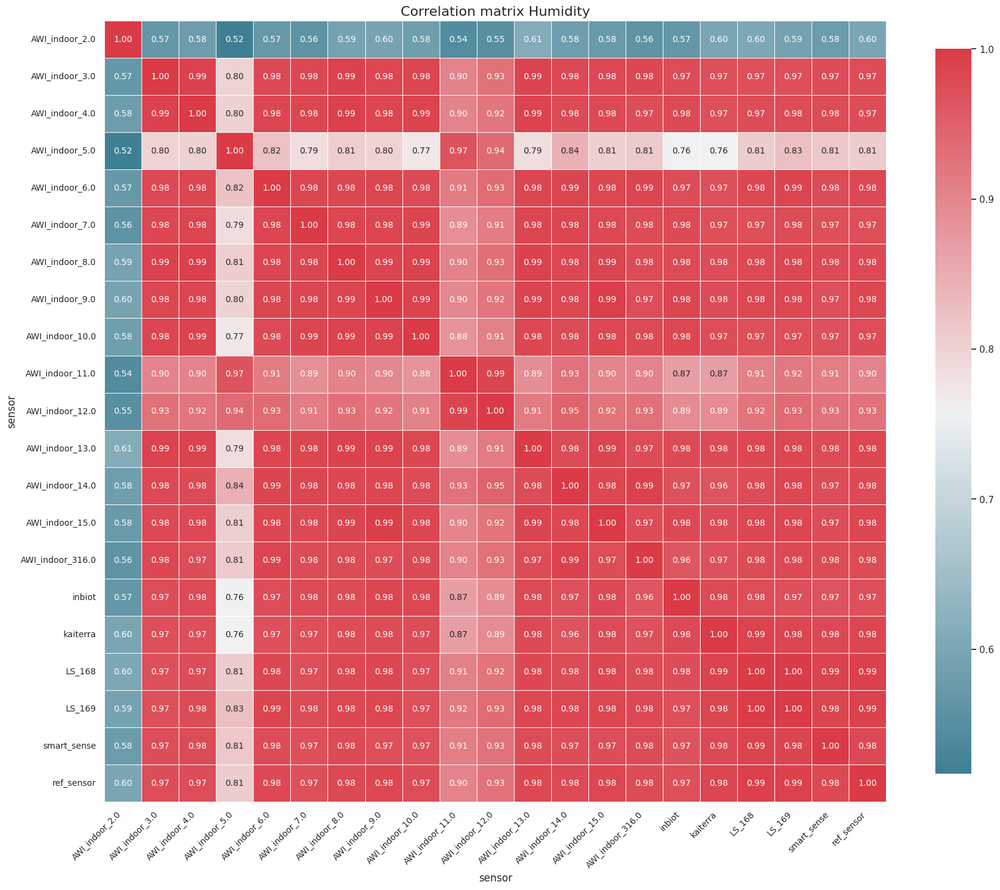

In [7]:
plot_correlation_matrix(pivot_full.resample('240s').mean()['2024-10-16 05:00:43':'2024-10-20 23:56:17'].corr(),"Correlation matrix Humidity")

## Box plots

In [8]:
plot_boxplot(pivot_full.resample('240s').mean()['2024-10-16 05:00:43':'2024-10-20 23:56:17'],col_names=['AWI_indoor_2.0','AWI_indoor_15.0','AWI_indoor_316.0','inbiot','LS_168','LS_169','smart_sense','ref_sensor'])

## Time series plot

In [10]:
plot_experiment_range(pivot_full.resample('240s').mean()['2024-10-16 05:00:43':'2024-11-02 23:56:17'],col_names=['AWI_indoor_316.0','inbiot','kaiterra','LS_168','LS_169','smart_sense','ref_sensor'])

In [11]:
diff_df = transform_diff_avg(pivot_full.resample('240s').mean())
diff_df

/home/usr1_tt/collocation_study/notebooks/all_sensors/../../src/transform.py:16: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



,Doors opened,Hall opened,Indoor Room Air Exchange,Rowing CD,Rowing OD,Human Presence,Diffuser (Water),Diffuser (Oil),Car (3m),Car (5m),...,Heater,Aquarium Pump,Tar (Neighbor Burning),Central Heating,VOC Tubes - Car,VOC Tubes - Diffuser (Oil),VOC Tubes - Gas Burner,VOC Tubes - Candle,Diffuser (Repeat),Boiling Water (Gas)
sensor,,,,,,,,,,,,,,,,,,,,,
AWI_indoor_2.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.194461,0.000000,0.000000,0.000000,0.000000,0.001683,0.015321,0.000000,0.000000,0.000000
AWI_indoor_3.0,-2.437883,-1.178759,-0.825526,0.606320,-3.707772,-0.395783,0.641026,0.000000,-3.242321,0.000000,...,0.001412,0.000000,0.000000,0.000000,-0.259692,-0.719720,1.262282,0.480531,0.000000,0.000000
AWI_indoor_4.0,-2.844842,-0.894905,-1.051481,1.946480,-3.924673,-0.453863,0.641026,0.621142,-3.658537,-1.666667,...,0.001298,0.000000,0.000000,0.000000,-0.603900,0.004106,0.609756,0.409387,0.000000,0.000000
AWI_indoor_5.0,-2.216076,-0.886273,-0.762263,0.529435,-3.935015,-0.318823,0.671171,0.641026,-3.125000,-1.282051,...,-0.073665,0.000000,0.000000,0.000000,0.337838,0.180653,1.102707,0.421038,0.000000,0.000000
AWI_indoor_6.0,-2.863851,-1.098167,-0.681372,0.000000,-4.584273,-0.521387,0.595238,0.578875,-5.113636,-2.325581,...,-0.069314,0.000000,0.000000,0.000000,0.339621,0.440994,0.873021,0.389930,0.000000,0.000000
AWI_indoor_7.0,-2.659393,-1.203862,-0.917556,1.853590,-4.654086,-0.489255,0.654711,0.156250,-4.907975,-1.282051,...,-0.075374,0.000000,0.000000,0.000000,-0.225970,0.000000,0.609756,0.359814,0.000000,0.000000
AWI_indoor_8.0,-2.274105,-1.175941,-0.519159,0.518809,-4.296837,-0.403546,0.157233,0.606984,-4.761905,-1.639344,...,-0.073368,0.000000,0.000000,0.000000,-0.291988,0.106896,0.595238,0.399273,0.000000,0.000000
AWI_indoor_9.0,-2.769859,-1.205396,-0.101521,1.562952,-4.329368,-0.485538,0.636969,0.413223,-5.487805,-1.875000,...,-0.073762,0.000000,0.000000,0.000000,-0.441002,-0.212344,0.595238,0.409402,0.000000,0.000000
AWI_indoor_10.0,-2.493777,-0.907375,-0.628798,1.596865,-3.706624,-0.460002,0.161290,0.000000,-3.305785,-1.282051,...,-0.018119,0.000000,0.000000,0.000000,-0.290698,0.109498,0.607018,0.308673,0.000000,0.000000


### Correlation matrix for diff DataFrame

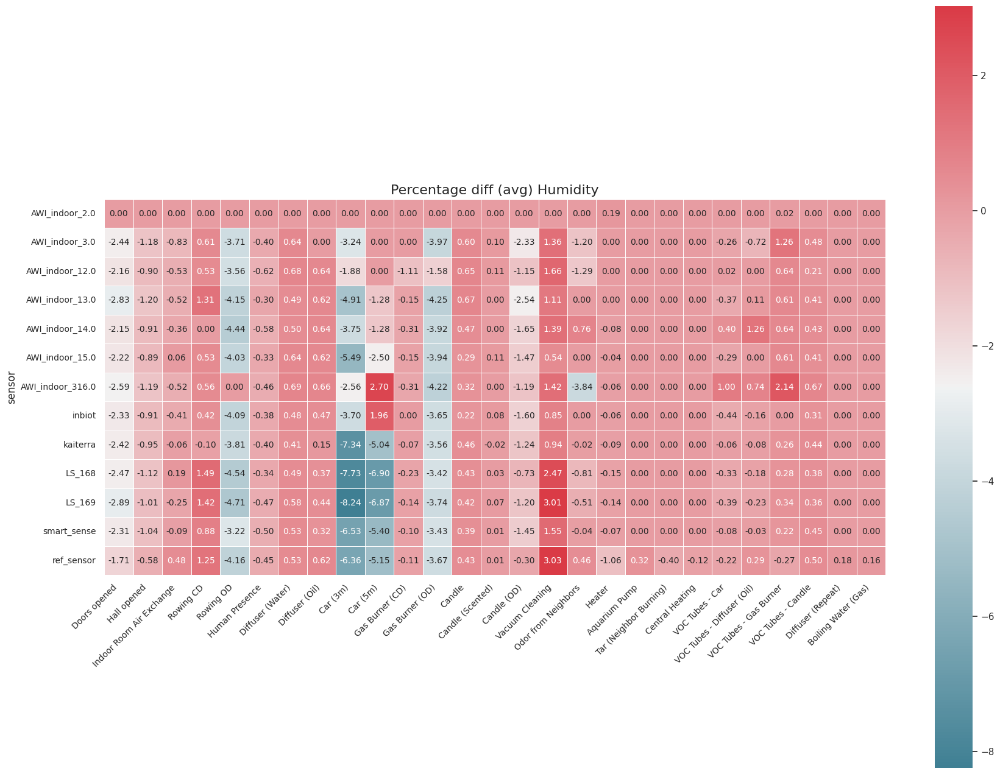

In [12]:
plot_correlation_matrix(diff_df.drop(['AWI_indoor_4.0','AWI_indoor_5.0','AWI_indoor_6.0','AWI_indoor_7.0','AWI_indoor_8.0','AWI_indoor_9.0','AWI_indoor_10.0','AWI_indoor_11.0']),title="Percentage diff (avg) Humidity")

###

In [13]:
df_diff_exp_data = transform_diff_experiments(pivot_full.resample('240s').mean())
df_diff_exp_data

/home/usr1_tt/collocation_study/notebooks/all_sensors/../../src/transform.py:37: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



sensor,AWI_indoor_2.0,AWI_indoor_3.0,AWI_indoor_4.0,AWI_indoor_5.0,AWI_indoor_6.0,AWI_indoor_7.0,AWI_indoor_8.0,AWI_indoor_9.0,AWI_indoor_10.0,AWI_indoor_11.0,...,AWI_indoor_13.0,AWI_indoor_14.0,AWI_indoor_15.0,AWI_indoor_316.0,inbiot,kaiterra,LS_168,LS_169,smart_sense,ref_sensor
datetime,,,,,,,,,,,,,,,,,,,,,
2024-10-16 09:16:00,0.0,-0.454545,-0.775194,0.000000,-2.127660,-1.162791,0.000000,-3.409091,-2.325581,-2.272727,...,-0.775194,0.000000,-3.409091,0.000000,0.000000,-6.458926,-10.582249,-9.563004,-5.954898,-5.308642
2024-10-16 09:20:00,0.0,-4.794521,-7.421875,-4.313725,-10.869565,-7.647059,-4.214559,-9.019608,-7.142857,-6.976744,...,-6.835938,-4.705882,-10.000000,-12.195122,0.000000,-9.770470,-11.677568,-12.808077,-9.657175,-6.882101
2024-10-16 09:24:00,0.0,-7.845152,-7.594937,-11.475410,-7.926829,-8.280255,-10.600000,-6.034483,-7.051282,-7.500000,...,-10.062893,-8.641975,-6.753813,0.000000,-12.500000,-2.786117,-1.534954,-2.939172,-2.752722,-1.750175
2024-10-16 09:28:00,0.0,-4.368030,-4.109589,-4.166667,-1.986755,-2.777778,-2.460850,-2.752294,0.000000,-2.702703,...,-2.797203,-5.405405,-1.869159,-5.555556,0.000000,-0.465923,1.637490,0.902901,-0.378485,-0.183225
2024-10-16 09:32:00,0.0,-2.040816,0.000000,0.000000,0.000000,-1.428571,-0.917431,-0.943396,-2.068966,0.000000,...,-2.158273,-0.714286,0.000000,0.000000,-6.122449,0.457218,0.578494,0.248112,0.058861,-0.122374
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-11-02 19:28:00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.130252
2024-11-02 19:32:00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.395066
2024-11-02 19:36:00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.285383


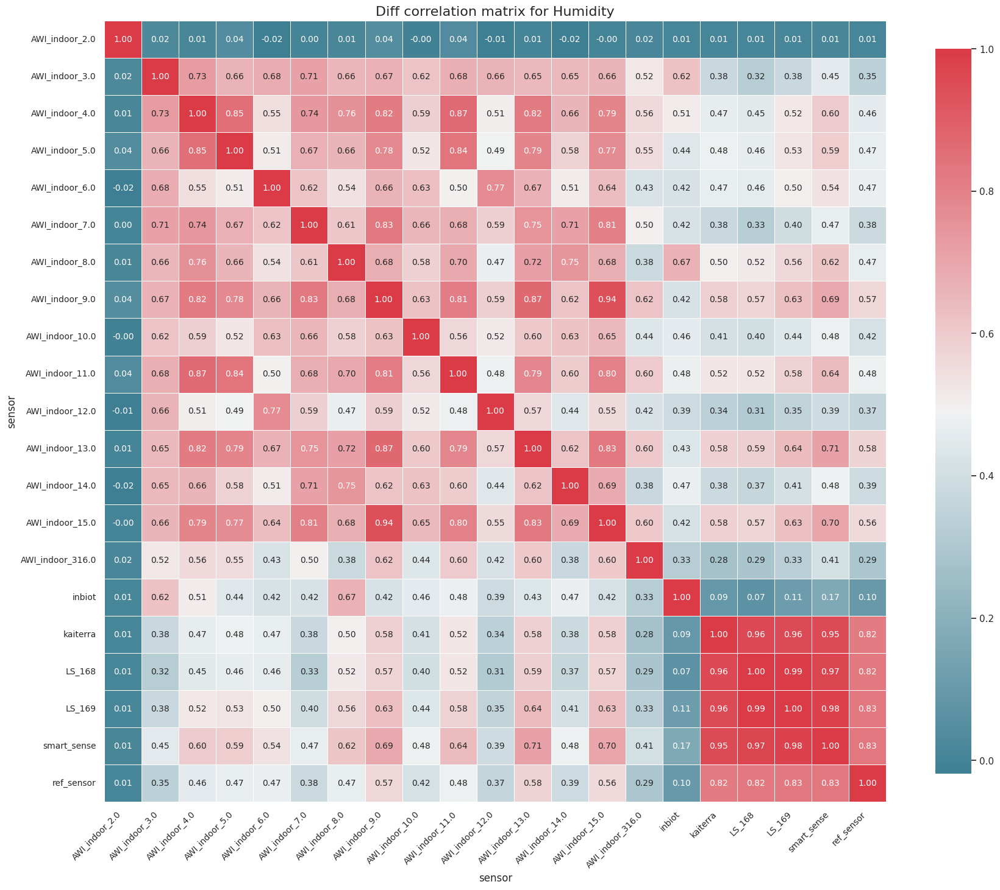

In [14]:
plot_correlation_matrix(df_diff_exp_data.corr(),title="Diff correlation matrix for Humidity")